# Global Wheat Detections using YOLO

Detection of wheat heads were done using fasterRCNN. Then we moved onto the state of the art model 'YOLO'

Initially to fix onto which ever version of YOLO to stick on with, we made experiments with a version of YOLO v5 and various versions of YOLO v8 (n,m,x). Then fixed onto YOLO v8 M version which showed better results and could fix on with it for more epochs too.

| EXP | MODEL  | AUGMENTATIONS | MODEL PARAMETERS | mAP50 | mAP(50-95) | PRIVATE | PUBLIC |
| -------- | -------- | ------- | ------- | ------- | ------- | ------- |------- |
| 1 | Yolo V5 | Default Augmentations | SGD, 20 epochs | 0.947 | 0.543 | 0.5838 | 0.6654 |
| 2 | Yolo V8 N |  Default Augmentations | SGD, 20 Epochs | 0.944 | 0.535 | 0.5632 | 0.6394 |
| 3 | Yolo V8 M |  Default Augmentations | SGD, 20 Epochs | 0.946 | 0.541 | 0.5948 | 0.6681 |


#### Experiments with augmentations:

| EXP | MODEL  | AUGMENTATIONS | MODEL PARAMETERS | mAP50 | mAP(50-95) | PRIVATE | PUBLIC |
| -------- | -------- | ------- | ------- | ------- | ------- | ------- |------- |
| 1 | Yolo V8 N | Removed all default augmentations | SGD, 20 Epochs | 0.922 | 0.524 | 0.4034 | 0.4478 |
| 2 | Yolo V8 M | Default Augmentations + Sharpen, gray, random brightness contrast, hue saturation | SGD, 20 epochs | 0.948 | 0.543 | 0.6003 | 0.6743 |
| 3 | Yolo V8 M |  Default Augmentations + Sharpen, gray, random brightness contrast, hue saturation, random gamma, blurs, noise, CLAHE | AdamW, 20 Epochs, Confidence Threshold = 0.5| 0.946 | 0.536 | 0.6171 | 0.6875 |
| 4 | Yolo V8 M | Default Augmentations + Sharpen, gray, random brightness contrast, hue saturation, random gamma, blurs, noise, CLAHE | AdamW, 20 Epochs, Confidence Threshold = 0.2 | 0.946 | 0.536 | 0.6228 | 0.7106 |
| 5 | Yolo V8 X |  Default Augmentations + Sharpen, gray, random brightness contrast, hue saturation, random gamma, blurs, noise, CLAHE | AdamW, 20 Epochs, Confidence Threshold = 0.2 | 0.946 | 0.531 | 0.6204 | 0.7138 |
| 6 | Yolo V8 X |  Default Augmentations + Sharpen, gray, random brightness contrast, hue saturation, random gamma, blurs, noise, CLAHE | AdamW, 20 Epochs, Confidence Threshold = 0.3 | 0.946 | 0.531 | 0.6296 | 0.7119 |
| 7 | Yolo V8 X |  Default Augmentations + Sharpen, gray, random brightness contrast, hue saturation, random gamma, blurs, noise, CLAHE | AdamW, 20 Epochs, Confidence Threshold = 0.5 | 0.946 | 0.531 | 0.5945 | 0.668 |

So after seeing rise in scores with the above augmentations, fixed it as a bench mark and tried variations with it.

Heavy Augmentations = Default Augmentations + Sharpen, gray, random brightness contrast, hue saturation, random gamma, blurs, noise, CLAHE

#### Experiments with hyper parameters

Experiments with hyper parameters, confidence threshold change and visualisation of the improval of scores is done below.

| EXP | MODEL  | AUGMENTATIONS | MODEL PARAMETERS | mAP50 | mAP(50-95) | PRIVATE | PUBLIC |
| -------- | -------- | ------- | ------- | ------- | ------- | ------- |------- |
| 1 | Yolo V8 M | Heavy Augmentations | AdamW, 30 epochs, cosine lr schedular, learning rate = 0.001 to 0.0001, non max suppression, Confidence Threshold = 0.2 | 0.949 | 0.55 | 0.6188 | 0.7127 |
| 2 | Yolo V8 M | Heavy Augmentations | AdamW, 30 Epochs, cosine lr schedular, learning rate = 0.001 to 0.0001, non max suppression, Confidence Threshold = 0.3 | 0.949 | 0.55 | 0.6355 | 0.7233 |
| 3 | Yolo V8 M | Heavy Augmentations | AdamW, 30 Epochs, cosine lr schedular, learning rate = 0.001 to 0.0001, non max suppression, Confidence Threshold = 0.5 | 0.949 | 0.55 | 0.6161 | 0.6952 |

### Architectural Changes

### YOLOv8.0n backbone Default architecture
backbone:
[from, repeats, module, args]
  - [-1, 1, Conv, [64, 3, 2]]  # 0-P1/2
  - [-1, 1, Conv, [128, 3, 2]]  # 1-P2/4
  - [-1, 3, C2f, [128, True]]
  - [-1, 1, Conv, [256, 3, 2]]  # 3-P3/8
  - [-1, 6, C2f, [256, True]]
  - [-1, 1, Conv, [512, 3, 2]]  # 5-P4/16
  - [-1, 6, C2f, [512, True]]
  - [-1, 1, Conv, [1024, 3, 2]]  # 7-P5/32
  - [-1, 3, C2f, [1024, True]]
  - [-1, 1, SPPF, [1024, 5]]  # 9

YOLOv8.0n head
head:
  - [-1, 1, nn.Upsample, [None, 2, 'nearest']]
  - [[-1, 6], 1, Concat, [1]]  # cat backbone P4
  - [-1, 3, C2f, [512]]  # 12

  - [-1, 1, nn.Upsample, [None, 2, 'nearest']]
  - [[-1, 4], 1, Concat, [1]]  # cat backbone P3
  - [-1, 3, C2f, [256]]  # 15 (P3/8-small)

  - [-1, 1, Conv, [256, 3, 2]]
  - [[-1, 12], 1, Concat, [1]]  # cat head P4
  - [-1, 3, C2f, [512]]  # 18 (P4/16-medium)

  - [-1, 1, Conv, [512, 3, 2]]
  - [[-1, 9], 1, Concat, [1]]  # cat head P5
  - [-1, 3, C2f, [1024]]  # 21 (P5/32-large)

  - [[15, 18, 21], 1, Detect, [nc]]  # Detect(P3, P4, P5)

### Modification 1
backbone:
[from, repeats, module, args]
  - [-1, 1, Conv, [64, 3, 2]]  # 0-P1/2
  - [-1, 2, Conv, [128, 3, 2]]  # 1-P2/4 # added number of repeats
  - [-1, 2, Conv, [256, 3, 2]] # added a new Convolution block and changed number of filters accordingly
  - [-1, 3, C2f, [256, True]]
  - [-1, 1, Conv, [512, 3, 2]]  # 3-P3/8
  - [-1, 6, C2f, [512, True]]
  - [-1, 1, Conv, [1024, 3, 2]]  # 5-P4/16
  - [-1, 6, C2f, [1024, True]]
  - [-1, 1, Conv, [2048, 3, 2]]  # 7-P5/32
  - [-1, 3, C2f, [2048, True]]
  - [-1, 1, SPPF, [2048, 5]]  # 9

YOLOv8.0n head
head:
  - [-1, 1, nn.Upsample, [None, 2, 'nearest']]
  - [[-1, 7], 1, Concat, [1]]  # cat backbone P4
  - [-1, 3, C2f, [1024]]  # 12

  - [-1, 1, nn.Upsample, [None, 2, 'nearest']]
  - [[-1, 5], 1, Concat, [1]]  # cat backbone P3
  - [-1, 3, C2f, [512]]  # 15 (P3/8-small)

  - [-1, 1, Conv, [512, 3, 2]]
  - [[-1, 13], 1, Concat, [1]]  # cat head P4
  - [-1, 3, C2f, [1024]]  # 18 (P4/16-medium)

  - [-1, 1, Conv, [1024, 3, 2]]
  - [[-1, 10], 1, Concat, [1]]  # cat head P5
  - [-1, 3, C2f, [2048]]  # 21 (P5/32-large)

  - [[16, 19, 22], 1, Detect, [nc]]  # Detect(P3, P4, P5)

### Modification 2

Added convolution, upsampling and concatenation blocks with C2f (coarse to fine network) to replicate a block which was existing.
 
backbone:
[from, repeats, module, args]
  - [-1, 1, Conv, [64, 3, 2]]  # 0-P1/2
  - [-1, 2, Conv, [128, 3, 2]]  # 1-P2/4
  - [-1, 2, Conv, [256, 3, 2]]  # 2 - P3
  - [-1, 1, Conv, [512, 3, 2]]  # 3-P4/8
  - [-1, 6, C2f, [512, True]]
  - [-1, 1, Conv, [1024, 3, 2]]  # 5-P5/16
  - [-1, 6, C2f, [1024, True]]
  - [-1, 1, Conv, [2048, 3, 2]]  # 7-P6/32
  - [-1, 6, C2f, [2048, True]]
  - [-1, 1, Conv, [4096, 3, 2]]  # 9-P7/64
  - [-1, 3, C2f, [4096, True]]
  - [-1, 1, SPPF, [4096, 5]]  # 11

YOLOv8.0n head
head:
  - [-1, 1, nn.Upsample, [None, 2, 'nearest']]
  - [[-1, 8], 1, Concat, [1]]  # cat backbone P6
  - [-1, 3, C2f, [2048]]  # 14

  - [-1, 1, nn.Upsample, [None, 2, 'nearest']]
  - [[-1, 6], 1, Concat, [1]]  # cat backbone P5
  - [-1, 3, C2f, [1024]]  # 17 

  - [-1, 1, nn.Upsample, [None, 2, 'nearest']]
  - [[-1, 4], 1, Concat, [1]]  # cat backbone P4
  - [-1, 3, C2f, [512]]  # 20

  - [-1, 1, Conv, [512, 3, 2]]
  - [[-1, 17], 1, Concat, [1]]  # cat head P4
  - [-1, 3, C2f, [1024]]  # 23 

  - [-1, 1, Conv, [1024, 3, 2]]
  - [[-1, 14], 1, Concat, [1]]  # cat head P6
  - [-1, 3, C2f, [2048]]  # 26 

  - [-1, 1, Conv, [2048, 3, 2]]
  - [[-1, 11], 1, Concat, [1]] 
  - [-1, 3, C2f, [4096]]  # 29 

  - [[20, 23, 26, 29], 1, Detect, [nc]]  # Detect(P3, P4, P5)

| EXP | MODEL  | AUGMENTATIONS | MODEL PARAMETERS | mAP50 | mAP(50-95) | PRIVATE | PUBLIC |
| -------- | -------- | ------- | ------- | ------- | ------- | ------- |------- |
| 1 | Yolo V8 N + Added convolutional layers | Heavy Augmentations  | AdamW, 20 epochs, cosine lr schedular, learning rate = 0.001 to 0.0001, non max suppression, Confidence Threshold = 0.2 | 0.912 | 0.481 | 0.5437 | 0.6397 |
| 2 | Yolo V8 N + Added upsampling blocks and detection blocks | Heavy Augmentations | AdamW, 20 Epochs, cosine lr schedular, learning rate = 0.001 to 0.0001, non max suppression, Confidence Threshold = 0.3 | 0.92 | 0.491 | 0.5431 | 0.6527 |

We did all the modifications with yaml file and as insisted we are about to do experiments with the interior of the layers.

# CODE :

### Import required dependencies

In [1]:
%cd /kaggle/input/yolov8/ultralytics-main

/kaggle/input/yolov8/ultralytics-main


In [2]:
import numpy as np 
import pandas as pd 
import seaborn as sns
import matplotlib.pyplot as plt
from tqdm.auto import tqdm
import shutil as sh
from IPython.display import Image, clear_output
from PIL import Image
import albumentations as A
from albumentations.pytorch import ToTensorV2

import os
import glob
import shutil
import torchvision
from torchvision.io import read_image
from torchvision.utils import draw_bounding_boxes
from shutil import copyfile
from pathlib import Path
from sklearn.model_selection import train_test_split
from PIL import Image, ImageDraw, ImageFont
from PIL import __version__ as pil_version
from ultralytics.yolo.utils import LOGGER, TryExcept, plt_settings, threaded
from ultralytics.yolo.utils.plotting import *
from scipy.ndimage import gaussian_filter1d

%matplotlib inline

In [4]:
import torch
print(torch.__version__)

import ultralytics
from ultralytics import YOLO
ultralytics.checks()

Ultralytics YOLOv8.0.170 🚀 Python-3.10.12 torch-2.0.0 CUDA:0 (Tesla P100-PCIE-16GB, 16281MiB)

Setup complete ✅ (2 CPUs, 15.6 GB RAM, 4974.3/8062.4 GB disk)


#### Some prerequisite arguments

In [6]:
path_train = '/kaggle/input/global-wheat-detection/train/'
path_test = '/kaggle/input/global-wheat-detection/test/'
img_size = 1024
batch = 8
epochs = 20

In [7]:
df = pd.read_csv('/kaggle/input/global-wheat-detection/train.csv')

In [9]:
%cd ../


df['path'] = df.apply(lambda sample: path_train+sample['image_id']+'.jpg', axis=1)
df.head()

/kaggle/input/yolov8


,image_id,width,height,bbox,source,path
0,b6ab77fd7,1024,1024,"[834.0, 222.0, 56.0, 36.0]",usask_1,/kaggle/input/global-wheat-detection/train/b6a...
1,b6ab77fd7,1024,1024,"[226.0, 548.0, 130.0, 58.0]",usask_1,/kaggle/input/global-wheat-detection/train/b6a...
2,b6ab77fd7,1024,1024,"[377.0, 504.0, 74.0, 160.0]",usask_1,/kaggle/input/global-wheat-detection/train/b6a...
3,b6ab77fd7,1024,1024,"[834.0, 95.0, 109.0, 107.0]",usask_1,/kaggle/input/global-wheat-detection/train/b6a...
4,b6ab77fd7,1024,1024,"[26.0, 144.0, 124.0, 117.0]",usask_1,/kaggle/input/global-wheat-detection/train/b6a...


In [10]:
df['path']

0         /kaggle/input/global-wheat-detection/train/b6a...
1         /kaggle/input/global-wheat-detection/train/b6a...
2         /kaggle/input/global-wheat-detection/train/b6a...
3         /kaggle/input/global-wheat-detection/train/b6a...
4         /kaggle/input/global-wheat-detection/train/b6a...
                                ...                        
147788    /kaggle/input/global-wheat-detection/train/5e0...
147789    /kaggle/input/global-wheat-detection/train/5e0...
147790    /kaggle/input/global-wheat-detection/train/5e0...
147791    /kaggle/input/global-wheat-detection/train/5e0...
147792    /kaggle/input/global-wheat-detection/train/5e0...
Name: path, Length: 147793, dtype: object

### View some images

In [11]:
def display_images(df):
    plt.figure(figsize=(50,50))
    j = 1
    for i in range(0,1000,100):
        image = plt.imread(df.path[i])
        
        image = cv2.resize(image, (img_size, img_size))
        plt.subplot(5,5,j)
        j+=1
        plt.imshow(image)
        plt.axis('off')

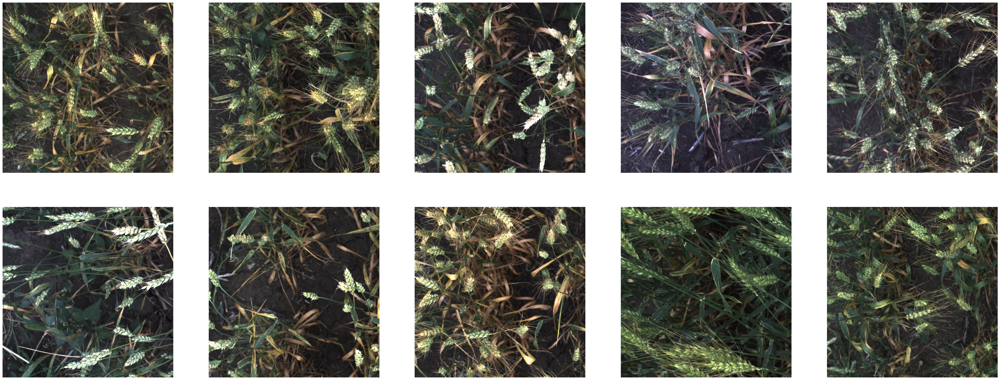

In [12]:
display_images(df)

### Split of Data

In [13]:
train, valid = train_test_split(df['image_id'].unique(), test_size=0.2, random_state=42)

In [14]:
train_df = df.loc[df['image_id'].isin(train)]
valid_df = df.loc[df['image_id'].isin(valid)]

train_df.loc[:, 'split'] = 'train'
valid_df.loc[:, 'split'] = 'valid'

df = pd.concat([train_df, valid_df]).reset_index(drop=True)

/tmp/ipykernel_23/1094959528.py:4: SettingWithCopyWarning: 

A value is trying to be set on a copy of a slice from a DataFrame.

Try using .loc[row_indexer,col_indexer] = value instead



See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  train_df.loc[:, 'split'] = 'train'

/tmp/ipykernel_23/1094959528.py:5: SettingWithCopyWarning: 

A value is trying to be set on a copy of a slice from a DataFrame.

Try using .loc[row_indexer,col_indexer] = value instead



See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  valid_df.loc[:, 'split'] = 'valid'


In [15]:
%cd ../../
%cd /kaggle/working/

os.makedirs('dataset/images/train', exist_ok=True)
os.makedirs('dataset/images/valid', exist_ok=True)

os.makedirs('dataset/labels/train', exist_ok=True)
os.makedirs('dataset/labels/valid', exist_ok=True)

%cd ../../
!tree /kaggle/working/dataset

/kaggle

/kaggle/working

/

/kaggle/working/dataset

├── images

│   ├── train

│   └── valid

└── labels

    ├── train

    └── valid



6 directories, 0 files


In [16]:
df

,image_id,width,height,bbox,source,path,split
0,b53afdf5c,1024,1024,"[988.0, 781.0, 36.0, 96.0]",usask_1,/kaggle/input/global-wheat-detection/train/b53...,train
1,b53afdf5c,1024,1024,"[331.0, 863.0, 70.0, 95.0]",usask_1,/kaggle/input/global-wheat-detection/train/b53...,train
2,b53afdf5c,1024,1024,"[47.0, 226.0, 65.0, 46.0]",usask_1,/kaggle/input/global-wheat-detection/train/b53...,train
3,b53afdf5c,1024,1024,"[682.0, 974.0, 108.0, 50.0]",usask_1,/kaggle/input/global-wheat-detection/train/b53...,train
4,b53afdf5c,1024,1024,"[63.0, 988.0, 156.0, 36.0]",usask_1,/kaggle/input/global-wheat-detection/train/b53...,train
...,...,...,...,...,...,...,...
147788,e6b5e296d,1024,1024,"[903.0, 176.0, 82.0, 62.0]",arvalis_2,/kaggle/input/global-wheat-detection/train/e6b...,valid
147789,e6b5e296d,1024,1024,"[156.0, 87.0, 94.0, 56.0]",arvalis_2,/kaggle/input/global-wheat-detection/train/e6b...,valid
147790,e6b5e296d,1024,1024,"[977.0, 43.0, 47.0, 77.0]",arvalis_2,/kaggle/input/global-wheat-detection/train/e6b...,valid
147791,e6b5e296d,1024,1024,"[0.0, 418.0, 49.0, 89.0]",arvalis_2,/kaggle/input/global-wheat-detection/train/e6b...,valid


In [17]:
# Move the images to relevant split folder.
for i in tqdm(range(len(df))):
    sample = df.loc[i]
    if sample['split'] == 'train':
        copyfile(sample['path'], f'kaggle/working/dataset/images/train/{sample["image_id"]}.jpg')
    else:
        copyfile(sample['path'], f'kaggle/working/dataset/images/valid/{sample["image_id"]}.jpg')

100%|██████████| 147793/147793 [02:47<00:00, 884.97it/s]


In [18]:
%cd ../../
%cd /kaggle/working/

/

/kaggle/working


#### Augmentations

In [2]:
input_folder = '/kaggle/working/dataset/images/train'
output_folder = '/kaggle/working/dataset/images/train'

# Create the output folder if it doesn't exist
os.makedirs(output_folder, exist_ok=True)

# Define a list of augmentation transformations
transform = A.Compose([
    A.RandomBrightnessContrast(p=0.5),  
    A.HueSaturationValue(p=0.5),      
    A.RGBShift(p=0.5),                
    A.RandomGamma(p=0.5),             
    A.CLAHE(p=0.5),                  
    A.Blur(p=0.5),                  
    A.MotionBlur(p=0.5),             
    A.GaussNoise(p=0.5),        
    A.ImageCompression(quality_lower=50, quality_upper=100, p=0.5), 
#     A.CoarseDropout(max_holes=8, max_height=50, max_width=50, p=0.5), 
    A.Sharpen(p=1.0),              
    A.ToGray(p=0.5),
])

# Iterate through the images in the input folder
for filename in os.listdir(input_folder):
    if filename.endswith(('.jpg', '.png', '.jpeg')):
        image = cv2.imread(os.path.join(input_folder, filename))

        # Apply the augmentations
        augmented_image = transform(image=image)['image']

        # Save the augmented image to the output folder
        output_path = os.path.join(output_folder, filename)

        cv2.imwrite(output_path, augmented_image)

In [20]:
%cd /kaggle/working/

/kaggle/working


#### Creation of yaml file with paths for model

In [21]:
%%writefile dataset.yaml
path: ../../../../../kaggle/working/dataset
train: images/train
val: images/valid
test: images/test
    

# Classes
names:
    0: none
    1: opacity

Writing dataset.yaml


In [22]:
%cat dataset.yaml

path: ../../../../../kaggle/working/dataset

train: images/train

val: images/valid

test: images/test

    



# Classes

names:

    0: none

    1: opacity


In [23]:
def get_bbox(row):
    bboxes = []
    bbox = []
    list1 = row.bbox.replace("[", "").replace("]","").replace(",","")
    for i in list1.split(" "):
        bboxes.append(float(i))
    return bboxes

In [24]:
# Convert the bounding boxes in YOLO format.
def get_yolo_format_bbox(img_w, img_h, bboxes):
    yolo_boxes = []
    x = bboxes[0]
    y = bboxes[1]
    w = bboxes[2] 
    h = bboxes[3] 
    xc = x + int(w/2) # xmin + width/2
    yc = y + int(h/2) # ymin + height/2
    yolo_boxes=[1, xc/img_w, yc/img_h, w/img_w, h/img_h] # x_center y_center width height
    yolo_boxes = str(yolo_boxes).replace("[", "").replace("]","").replace(",","")
    return yolo_boxes

In [25]:
# Prepare the txt files for bounding box
for i in tqdm(range(len(df))):
    row = df.loc[i]
    # Get image id
    img_id = row.image_id
    # Get split
    split = row.split
    
    if row.split=='train':
        file_name = f'dataset/labels/train/{row.image_id}.txt'
    else:
        file_name = f'dataset/labels/valid/{row.image_id}.txt'
        
    bboxes = get_bbox(row)
        
    # Format for YOLOv5
    yolo_bboxes = get_yolo_format_bbox(img_size, img_size, bboxes)
        
    with open(file_name, 'a') as f:
        f.write(yolo_bboxes)
        f.write('\n')
    #print(file_name)
    #print(yolo_bboxes)

100%|██████████| 147793/147793 [00:29<00:00, 4965.18it/s]


In [26]:
TRAIN_PATH = 'dataset/images/train'
TRAIN_LABEL_PATH = 'dataset/labels/train'

In [27]:
train_files = os.listdir(TRAIN_LABEL_PATH)
print('Number of test images predicted as opaque: ', len(train_files))

Number of test images predicted as opaque:  2698


In [28]:
def display_images_with_box(num):
    pred = []
    bbox = []
    image_id = []
    k = 1
    plt.figure(figsize=(30,30))
    for i in train_files[:num]:
        with open(f'{TRAIN_LABEL_PATH}/{i}') as f:
            img = read_image(f'{TRAIN_PATH}/{i[:-4]}.jpg')
            bbox = []
            for j in f:
                pred = i[:-4] + " " + j[:-1]
                pred = pred.split(" ")
                pred.pop(0)
                pred.pop(0)
                pred = [eval(i) for i in pred]
                pred = [i*1024 for i in pred]
                [x, y, w, h] = pred
                [xmin, ymin, xmax, ymax] = [x-w/2, y-h/2, x+w/2, y+h/2,]
                pred = [xmin, ymin, xmax, ymax]
                bbox.append(pred)
            bbox = torch.tensor(bbox, dtype=torch.int)
            img = draw_bounding_boxes(img, bbox, width=10,colors=(255,0,0))
            img = torchvision.transforms.ToPILImage()(img)
            plt.subplot(num//3+num%3,3,k)
            k+=1
            plt.imshow(img)
            plt.axis('off')

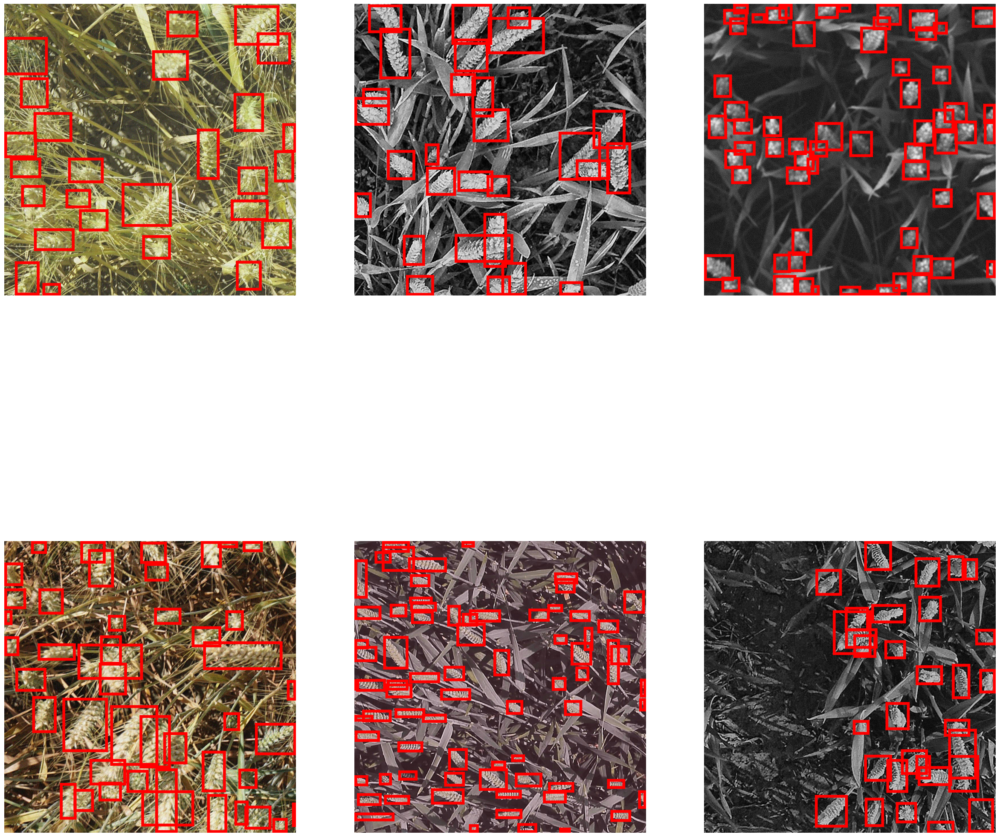

In [29]:
display_images_with_box(6)

In [30]:
len(train_df), len(valid_df)

(118371, 29422)

In [31]:
%cd ../../../
%cd /kaggle/working/

/

/kaggle/working


In [32]:
model = YOLO("yolov8m.yaml").load("yolov8m.pt")



                   from  n    params  module                                       arguments                     

  0                  -1  1      1392  ultralytics.nn.modules.conv.Conv             [3, 48, 3, 2]                 

  1                  -1  1     41664  ultralytics.nn.modules.conv.Conv             [48, 96, 3, 2]                

  2                  -1  2    111360  ultralytics.nn.modules.block.C2f             [96, 96, 2, True]             

  3                  -1  1    166272  ultralytics.nn.modules.conv.Conv             [96, 192, 3, 2]               

  4                  -1  4    813312  ultralytics.nn.modules.block.C2f             [192, 192, 4, True]           

  5                  -1  1    664320  ultralytics.nn.modules.conv.Conv             [192, 384, 3, 2]              

  6                  -1  4   3248640  ultralytics.nn.modules.block.C2f             [384, 384, 4, True]           

  7                  -1  1   1991808  ultralytics.nn.modules.conv.Conv        

In [33]:
!wandb off
model.train(data='dataset.yaml', epochs=30, imgsz=img_size, batch=batch, save_period=1, cls=1, nms = True, cos_lr = True, optimizer = 'AdamW', lr0 = 0.0001, lrf = 0.00001, weight_decay=0.0003)#, hsv_h=0.0, hsv_s=0.0, hsv_v=0.0, degrees=0.0, translate=0.0, scale=0.0, shear=0.0, perspective=0.0, flipud=0.0, fliplr=0.0, mosaic=0.0 )

/bin/bash: line 1: wandb: command not found


New https://pypi.org/project/ultralytics/8.0.171 available 😃 Update with 'pip install -U ultralytics'

Ultralytics YOLOv8.0.170 🚀 Python-3.10.12 torch-2.0.0 CUDA:0 (Tesla P100-PCIE-16GB, 16281MiB)

engine/trainer: task=detect, mode=train, model=yolov8m.yaml, data=dataset.yaml, epochs=30, patience=50, batch=8, imgsz=1024, save=True, save_period=1, cache=False, device=None, workers=8, project=None, name=None, exist_ok=False, pretrained=True, optimizer=AdamW, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=True, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, show=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, vid_stride=1, stream_buffer=False, line_width=None, visualize=False, augment=False, agnosti

ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([1])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x79997feb4af0>
fitness: 0.5917918054593625
keys: ['metrics/precision(B)', 'metrics/recall(B)', 'metrics/mAP50(B)', 'metrics/mAP50-95(B)']
maps: array([    0.55196,     0.55196])
names: {0: 'none', 1: 'opacity'}
plot: False
results_dict: {'metrics/precision(B)': 0.9214365178116124, 'metrics/recall(B)': 0.9044932363537489, 'metrics/mAP50(B)': 0.9503090373534464, 'metrics/mAP50-95(B)': 0.5519565574711309, 'fitness': 0.5917918054593625}
save_dir: PosixPath('runs/detect/train')
speed: {'preprocess': 0.39839426676432294, 'inference': 25.459152504249857, 'loss': 0.002497213858145255, 'postprocess': 1.8111292521158853}